<a href="https://colab.research.google.com/github/ManiyaRaskolnikova/computer-linguistics-megre/blob/main/vectors_megre.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Домашка

In [2]:
!pip install gensim

In [3]:
# сначала импортируем все нужные библиотеки
import pandas as pd
import numpy as np
import gensim
import gensim.downloader as api
from gensim import corpora
from gensim.models import TfidfModel
from pprint import pprint
import re
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
from google.colab import files

1. Скачать [датасет по ссылке](https://raw.githubusercontent.com/tyqiangz/multilingual-sentiment-datasets/refs/heads/main/data/english/test.csv) (просто запустить строку ниже)

In [4]:
!wget https://raw.githubusercontent.com/tyqiangz/multilingual-sentiment-datasets/refs/heads/main/data/english/test.csv

--2025-11-07 19:41:43--  https://raw.githubusercontent.com/tyqiangz/multilingual-sentiment-datasets/refs/heads/main/data/english/test.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 102826 (100K) [text/plain]
Saving to: ‘test.csv.2’

test.csv.2          100%[===================>] 100.42K  --.-KB/s    in 0.01s   

2025-11-07 19:41:43 (6.56 MB/s) - ‘test.csv.2’ saved [102826/102826]



2. Открыть csv и сохранить текст в переменную (макс. балл == 1)

In [5]:
# откроем csv файл, сохраним датафрейм в переменную и выведем первые 5 строк для ознакомления
data = pd.read_csv('https://raw.githubusercontent.com/tyqiangz/multilingual-sentiment-datasets/refs/heads/main/data/english/test.csv')
data.head()

,text,label,source
0,Trying to have a conversation with my dad abou...,negative,sem_eval_2017
1,#latestnews 4 #newmexico #politics + #nativeam...,neutral,sem_eval_2017
2,@user You are a stand up guy and a Gentleman V...,positive,sem_eval_2017
3,@user @user @user Looks like Flynn isn't too p...,negative,sem_eval_2017
4,perfect pussy clips #vanessa hudgens zac efron...,neutral,sem_eval_2017


3. Извлечь столбец с текстами (макс. балл == 1)

In [6]:
# извлечем столбец с текстами и сохраним его в переменную texts
texts = data['text'].tolist()
#выведем первый элемент списка для примера
texts[0]

'Trying to have a conversation with my dad about vegetarianism is the most pointless infuriating thing ever #caveman '

4. Построить Bag-of-Words (макс. балл == 3)

In [7]:
#удалим знаки припенания во всех текстах
cleaned_texts = [re.sub(r'[^\w\s]', '', text) for text in texts]
print("Пример очищенного текста:")
pprint(cleaned_texts[0])

Пример очищенного текста:
('Trying to have a conversation with my dad about vegetarianism is the most '
 'pointless infuriating thing ever caveman ')


In [8]:
# Токенизация
tokenized_texts = [text.lower().split() for text in cleaned_texts]
print("Пример токенизированного текста:")
pprint(tokenized_texts[0])

Пример токенизированного текста:
['trying',
 'to',
 'have',
 'a',
 'conversation',
 'with',
 'my',
 'dad',
 'about',
 'vegetarianism',
 'is',
 'the',
 'most',
 'pointless',
 'infuriating',
 'thing',
 'ever',
 'caveman']


In [9]:
# создадим словарь
dictionary = corpora.Dictionary(tokenized_texts)
print(f"Словарь: {dictionary.token2id}")

Словарь: {'a': 0, 'about': 1, 'caveman': 2, 'conversation': 3, 'dad': 4, 'ever': 5, 'have': 6, 'infuriating': 7, 'is': 8, 'most': 9, 'my': 10, 'pointless': 11, 'the': 12, 'thing': 13, 'to': 14, 'trying': 15, 'vegetarianism': 16, 'with': 17, '4': 18, 'altright': 19, 'at': 20, 'israel': 21, 'latestnews': 22, 'nativeamerican': 23, 'newmexico': 24, 'of': 25, 'palestine': 26, 'politics': 27, 'protesting': 28, 'rise': 29, 'and': 30, 'are': 31, 'gentleman': 32, 'guy': 33, 'pence': 34, 'president': 35, 'stand': 36, 'up': 37, 'user': 38, 'vice': 39, 'you': 40, 'blocked': 41, 'by': 42, 'flynn': 43, 'he': 44, 'isnt': 45, 'like': 46, 'looks': 47, 'me': 48, 'pleased': 49, 'too': 50, 'clips': 51, 'efron': 52, 'hudgens': 53, 'naked': 54, 'perfect': 55, 'pussy': 56, 'vanessa': 57, 'zac': 58, 'but': 59, 'catholic': 60, 'dude': 61, 'even': 62, 'everything': 63, 'francis': 64, 'him': 65, 'hug': 66, 'i': 67, 'im': 68, 'just': 69, 'need': 70, 'not': 71, 'okay': 72, 'pope': 73, 'tell': 74, 'al': 75, 'americ

In [10]:
dictionary.token2id

{'a': 0,
 'about': 1,
 'caveman': 2,
 'conversation': 3,
 'dad': 4,
 'ever': 5,
 'have': 6,
 'infuriating': 7,
 'is': 8,
 'most': 9,
 'my': 10,
 'pointless': 11,
 'the': 12,
 'thing': 13,
 'to': 14,
 'trying': 15,
 'vegetarianism': 16,
 'with': 17,
 '4': 18,
 'altright': 19,
 'at': 20,
 'israel': 21,
 'latestnews': 22,
 'nativeamerican': 23,
 'newmexico': 24,
 'of': 25,
 'palestine': 26,
 'politics': 27,
 'protesting': 28,
 'rise': 29,
 'and': 30,
 'are': 31,
 'gentleman': 32,
 'guy': 33,
 'pence': 34,
 'president': 35,
 'stand': 36,
 'up': 37,
 'user': 38,
 'vice': 39,
 'you': 40,
 'blocked': 41,
 'by': 42,
 'flynn': 43,
 'he': 44,
 'isnt': 45,
 'like': 46,
 'looks': 47,
 'me': 48,
 'pleased': 49,
 'too': 50,
 'clips': 51,
 'efron': 52,
 'hudgens': 53,
 'naked': 54,
 'perfect': 55,
 'pussy': 56,
 'vanessa': 57,
 'zac': 58,
 'but': 59,
 'catholic': 60,
 'dude': 61,
 'even': 62,
 'everything': 63,
 'francis': 64,
 'him': 65,
 'hug': 66,
 'i': 67,
 'im': 68,
 'just': 69,
 'need': 70,
 'n

In [11]:
# Преобразуем все тексты в BoW векторы
bow_corpus = [dictionary.doc2bow(text) for text in tokenized_texts]
print("Bag-of-Words векторы (индекс_слова: частота):")
for i, text_vec in enumerate(bow_corpus, 1):
    print(f"Документ {i}: {text_vec}")

Bag-of-Words векторы (индекс_слова: частота):
Документ 1: [(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1), (10, 1), (11, 1), (12, 1), (13, 1), (14, 1), (15, 1), (16, 1), (17, 1)]
Документ 2: [(18, 1), (19, 1), (20, 1), (21, 1), (22, 1), (23, 1), (24, 1), (25, 1), (26, 1), (27, 1), (28, 1), (29, 1)]
Документ 3: [(0, 2), (30, 1), (31, 1), (32, 1), (33, 1), (34, 1), (35, 1), (36, 1), (37, 1), (38, 1), (39, 1), (40, 1)]
Документ 4: [(17, 1), (38, 4), (40, 1), (41, 2), (42, 1), (43, 2), (44, 1), (45, 1), (46, 1), (47, 1), (48, 2), (49, 1), (50, 2)]
Документ 5: [(51, 1), (52, 1), (53, 1), (54, 1), (55, 1), (56, 1), (57, 1), (58, 1)]
Документ 6: [(8, 2), (10, 1), (14, 1), (30, 1), (46, 1), (48, 2), (59, 1), (60, 1), (61, 1), (62, 1), (63, 1), (64, 1), (65, 1), (66, 1), (67, 1), (68, 1), (69, 1), (70, 1), (71, 1), (72, 1), (73, 1), (74, 1)]
Документ 7: [(1, 1), (6, 1), (8, 1), (12, 1), (38, 1), (40, 1), (75, 1), (76, 1), (77, 1), (78, 1), (79, 1), (80, 1), (81, 

In [19]:
# построим частотную таблицу для всех слов

word_freq = Counter()
for doc in bow_corpus:
    word_freq.update(dict(doc))

freq_df = pd.DataFrame(
    [(dictionary[id], freq) for id, freq in word_freq.items()],
    columns=["word", "frequency"]
).sort_values(by="frequency", ascending=False)

# выведем 20 самых частотных слов
display(freq_df.head(20))

,word,frequency
38,user,570
12,the,387
14,to,268
0,a,227
25,of,199
8,is,186
80,for,176
116,in,165
30,and,164
67,i,135


In [12]:
# преобразуем в плотные векторы для визуализации
def bow_to_dense(bow_corpus, dictionary):
    dense_vectors = []
    for text in bow_corpus:
        dense_vec = [0] * len(dictionary)
        for idx, freq in text:
            dense_vec[idx] = freq
        dense_vectors.append(dense_vec)
    return dense_vectors

dense_vectors = bow_to_dense(bow_corpus, dictionary)
print("Плотные векторы Bag-of-Words:")
print("Слова:", list(dictionary.token2id.keys()))
for i, vec in enumerate(dense_vectors, 1):
    print(f"Текст {i}: {vec}")

Плотные векторы Bag-of-Words:
Слова: ['a', 'about', 'caveman', 'conversation', 'dad', 'ever', 'have', 'infuriating', 'is', 'most', 'my', 'pointless', 'the', 'thing', 'to', 'trying', 'vegetarianism', 'with', '4', 'altright', 'at', 'israel', 'latestnews', 'nativeamerican', 'newmexico', 'of', 'palestine', 'politics', 'protesting', 'rise', 'and', 'are', 'gentleman', 'guy', 'pence', 'president', 'stand', 'up', 'user', 'vice', 'you', 'blocked', 'by', 'flynn', 'he', 'isnt', 'like', 'looks', 'me', 'pleased', 'too', 'clips', 'efron', 'hudgens', 'naked', 'perfect', 'pussy', 'vanessa', 'zac', 'but', 'catholic', 'dude', 'even', 'everything', 'francis', 'him', 'hug', 'i', 'im', 'just', 'need', 'not', 'okay', 'pope', 'tell', 'al', 'america', 'as', 'crying', 'do', 'for', 'how', 'left', 'middle', 'much', 'outthey', 'power', 'twice', 'voting', 'class', 'comey', 'editorial', 'families', 'fbis', 'had', 'no', 'one', 'sentinel', '5', '70', 'android', 'bring', 'edge', 'galaxy', 'news', 'note', 'nougat', 's2

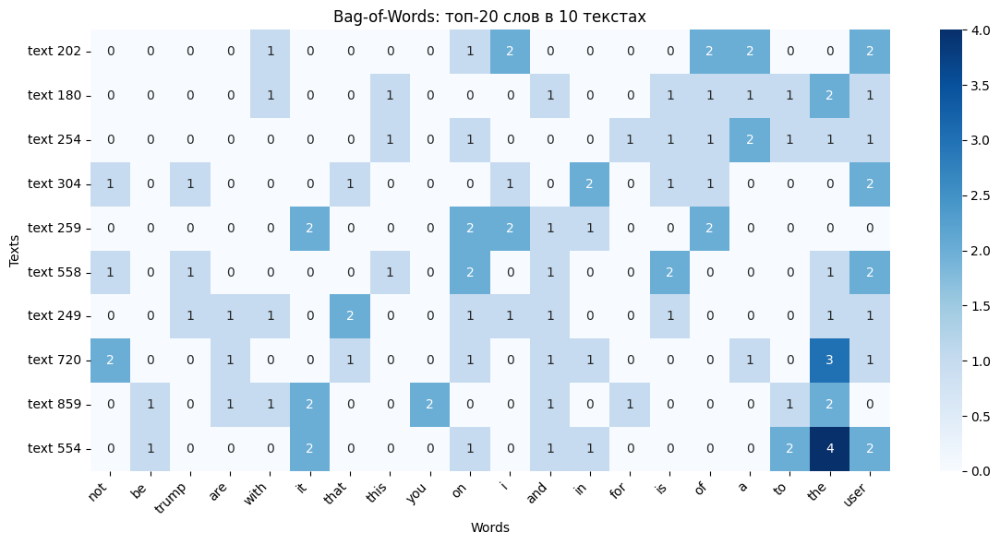

In [22]:
# У меня возникли проблемы с загрузкой всего датасета, пишет, что работа завершена из-за исчерпания памяти(
# Я не уверена, что это решение правильно, но я вывела срез из самых частотных слов в текстах, где они встречаются наиболее часто

matrix = np.array(dense_vectors)
words = list(dictionary.token2id.keys())
text_names = [f"text {i+1}" for i in range(len(texts))]

# возьмем топ-20 самых частых слов
word_freq = np.asarray(matrix.sum(axis=0)).ravel()
top_cols = np.argsort(word_freq)[-20:]

# выберем те тексты, где эти слова встречаются чаще
row_strength = np.asarray(matrix[:, top_cols].sum(axis=1)).ravel()
top_rows = np.argsort(row_strength)[-10:]

sub = matrix[top_rows][:, top_cols]

fig, ax = plt.subplots(figsize=(12, 6))
sns.heatmap(
    sub,
    ax=ax,
    annot=True,
    fmt='d',
    cmap='Blues',
    cbar=True,
    )
ax.set_title('Bag-of-Words: топ-20 слов в 10 текстах')
ax.set_xlabel('Words'); ax.set_ylabel('Texts')

ax.set_xticklabels([words[i] for i in top_cols], rotation=45, ha='right')
ax.set_yticklabels([f'text {i}' for i in top_rows], rotation=0)

plt.tight_layout()
plt.show()


In [24]:
# теперь выведем 10 самых частотных слов в нашем корпусе
# для этого обратимся к уже созданной таблице частотности

top10_words = freq_df.head(10)["word"].tolist()
print("Топ-10 самых частотных слов:")
print(", ".join(top10_words))

Топ-10 самых частотных слов:
user, the, to, a, of, is, for, in, and, i


5. Построить TF-IDF (макс. балл == 5)

In [26]:
# получим TF-IDF векторы для каждого текста
tfidf_model = TfidfModel(bow_corpus)
tfidf_corpus = tfidf_model[bow_corpus]

print("TF-IDF векторы (индекс_слова: tfidf_вес):")
for i, doc_vec in enumerate(tfidf_corpus, 1):
    print(f"Текст {i}: {[(dictionary[idx], round(score, 3)) for idx, score in doc_vec]}")

TF-IDF векторы (индекс_слова: tfidf_вес):
Текст 1: [('a', np.float64(0.078)), ('about', np.float64(0.163)), ('caveman', np.float64(0.35)), ('conversation', np.float64(0.35)), ('dad', np.float64(0.314)), ('ever', np.float64(0.257)), ('have', np.float64(0.149)), ('infuriating', np.float64(0.35)), ('is', np.float64(0.087)), ('most', np.float64(0.21)), ('my', np.float64(0.149)), ('pointless', np.float64(0.35)), ('the', np.float64(0.056)), ('thing', np.float64(0.236)), ('to', np.float64(0.069)), ('trying', np.float64(0.293)), ('vegetarianism', np.float64(0.226)), ('with', np.float64(0.132))]
Текст 2: [('4', np.float64(0.238)), ('altright', np.float64(0.281)), ('at', np.float64(0.162)), ('israel', np.float64(0.234)), ('latestnews', np.float64(0.369)), ('nativeamerican', np.float64(0.369)), ('newmexico', np.float64(0.369)), ('of', np.float64(0.086)), ('palestine', np.float64(0.256)), ('politics', np.float64(0.309)), ('protesting', np.float64(0.331)), ('rise', np.float64(0.309))]
Текст 3: [('a

In [31]:
# для каждого слова вычислим TF, DF, IDF и TF-IDF

def analyze_tfidf_components(bow_corpus, dictionary):
    tf_matrix = np.zeros((len(bow_corpus), len(dictionary)))
    for text_idx, text in enumerate(bow_corpus):
        total_terms = sum(freq for _, freq in text)  # общее число слов в документе
        for word_idx, freq in text:
            tf_matrix[text_idx, word_idx] = freq / total_terms  # TF(t,d) = count / total_terms

    # вычисляем DF
    df_vector = np.sum(tf_matrix > 0, axis=0)

    # вычисляем IDF
    N = len(bow_corpus)
    idf_vector = np.log(N / (df_vector + 1)) + 1

    # вычисляем TF-IDF
    tfidf_manual = tf_matrix * idf_vector

    return tf_matrix, df_vector, idf_vector, tfidf_manual


# применим функцию и сохраним результат в таблицу
tf_matrix, df_vector, idf_vector, tfidf_manual = analyze_tfidf_components(bow_corpus, dictionary)
words = list(dictionary.token2id.keys())
texts = [f"text {i+1}" for i in range(len(bow_corpus))]
rows = []
for text_idx, text_name in enumerate(texts):
    for word_idx, word in enumerate(words):
        tf = tf_matrix[text_idx, word_idx]
        if tf > 0:
            rows.append({
                "Text": text_name,
                "word": word,
                "tf": tf,
                "df": int(df_vector[word_idx]),
                "idf": idf_vector[word_idx],
                "tfidf": tfidf_manual[text_idx, word_idx]
            })

tfidf_df = pd.DataFrame(rows)

In [32]:
# посмотрим на получившуюся таблицу
tfidf_df.head(10)

,Text,word,tf,df,idf,tfidf
0,text 1,a,0.055556,191,2.510998,0.139500
1,text 1,about,0.055556,37,4.130907,0.229495
2,text 1,caveman,0.055556,1,7.075346,0.393075
3,text 1,conversation,0.055556,1,7.075346,0.393075
4,text 1,dad,0.055556,2,6.669881,0.370549
5,text 1,ever,0.055556,6,5.822583,0.323477
6,text 1,have,0.055556,49,3.856470,0.214248
7,text 1,infuriating,0.055556,1,7.075346,0.393075
8,text 1,is,0.055556,163,2.668627,0.148257
9,text 1,most,0.055556,15,4.995904,0.277550


In [33]:
# сохраним результаты в формате .csv
tfidf_df.to_csv("tfidf_table.csv", index=False, encoding="utf-8")

# и скачаем файл
files.download("tfidf_table.csv")

##### **Как вычислить компоненты вручную**

```python
def analyze_tfidf_components(bow_corpus, dictionary):
    # Шаг 1: Создаем матрицу TF (term frequency)
    tf_matrix = np.zeros((len(bow_corpus), len(dictionary)))
    for doc_idx, doc in enumerate(bow_corpus):
        for word_idx, freq in doc:
            tf_matrix[doc_idx, word_idx] = freq
    
    # Шаг 2: Вычисляем DF (document frequency)
    df_vector = np.sum(tf_matrix > 0, axis=0)  # Количество документов с каждым словом
    
    # Шаг 3: Вычисляем IDF (inverse document frequency)
    N = len(bow_corpus)  # общее количество документов
    idf_vector = np.log(N / (df_vector + 1)) + 1
    
    # Шаг 4: Вычисляем TF-IDF вручную
    tfidf_manual = tf_matrix * idf_vector
    
    return tf_matrix, df_vector, idf_vector, tfidf_manual
```

6. Произвести сравните

*Эта часть не оценивается, но будет давать доп. баллы на экзамене для тех, кто выполнит её*

In [ ]:
# Сравните BoW и TF-IDF для конкретных слов
# - Выберите 3-4 слова из датасета (выберите слова, характерные для датасета)
# - Постройте графики сравнения их весов в BoW и TF-IDF

##### **Как построить сравнительный график**
```python
def compare_bow_tfidf(words, bow_dense, tfidf_dense, dictionary):
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    
    for i, word in enumerate(words):
        row, col = i // 2, i % 2
        word_id = dictionary.token2id[word]
        
        # Веса для этого слова во всех документах
        bow_weights = [doc[word_id] for doc in bow_dense]
        tfidf_weights = [doc[word_id] for doc in tfidf_dense]
        
        x = range(len(bow_dense))
        axes[row, col].bar(x, bow_weights, alpha=0.7, label='BoW', width=0.4)
        axes[row, col].bar([p + 0.4 for p in x], tfidf_weights, alpha=0.7, label='TF-IDF', width=0.4)
        axes[row, col].set_title(f'Сравнение весов: "{word}"')
        axes[row, col].legend()
        axes[row, col].set_xticks([p + 0.2 for p in x])
        axes[row, col].set_xticklabels([f'Док {i+1}' for i in x])
    
    plt.tight_layout()
    plt.show()
```